#### We import all necessary libraries

In [1]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

# uncomment this line if you haven't completed the Foursquare API lab
#!conda install -c conda-forge geopy --yes 
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

# uncomment this line if you haven't completed the Foursquare API lab
#!conda install -c conda-forge folium=0.5.0 --yes 
import folium # map rendering library

from sklearn.cluster import KMeans 
from sklearn import metrics 
from scipy.spatial.distance import cdist
import matplotlib.pyplot as plt

import matplotlib.ticker as ticker
from sklearn import preprocessing
%matplotlib inline


print('Libraries imported.')

Libraries imported.


#### To obtain population data from Wikipedia

In [2]:
url = 'https://en.wikipedia.org/wiki/List_of_cities_in_Haiti'
df_Haiti=pd.read_html(url)[0]
df_Haiti

,Communes,Department,Arrondissement,Population
0,Abricots,Grand'Anse,Jérémie,34262
1,Acul-du-Nord,Nord,Acul-du-Nord,50844
2,Anse-à-Foleur,Nord-Ouest,Saint-Louis-du-Nord,27480
3,Anse-à-Galets,Ouest,Gonâve,56890
4,Anse-à-Veau,Nippes,Anse-à-Veau,31477
5,Anse-à-Pitres,Sud-Est,Belle-Anse,27415
6,Anse-d'Hainault,Grand'Anse,Anse d'Hainault,33103
7,Anse-Rouge,Artibonite,Gros-Morne,39463
8,Aquin,Sud,Aquin,94773
9,Arcahaie,Ouest,Arcahaie,118501


In [3]:
df_Haiti.shape

(140, 4)

#### We clean data by dropping column with Communes as is not necessary for this specific project

In [4]:
df_Haiti_data=df_Haiti
df_Haiti_data.drop('Communes', axis = 'columns',inplace=True)

df_Haiti_data

,Department,Arrondissement,Population
0,Grand'Anse,Jérémie,34262
1,Nord,Acul-du-Nord,50844
2,Nord-Ouest,Saint-Louis-du-Nord,27480
3,Ouest,Gonâve,56890
4,Nippes,Anse-à-Veau,31477
5,Sud-Est,Belle-Anse,27415
6,Grand'Anse,Anse d'Hainault,33103
7,Artibonite,Gros-Morne,39463
8,Sud,Aquin,94773
9,Ouest,Arcahaie,118501


#### We remain column Arrondissement to be City

In [5]:
df_Haiti_data=df_Haiti_data.rename(columns={'Arrondissement':'City'},inplace=False)
df_Haiti_data

,Department,City,Population
0,Grand'Anse,Jérémie,34262
1,Nord,Acul-du-Nord,50844
2,Nord-Ouest,Saint-Louis-du-Nord,27480
3,Ouest,Gonâve,56890
4,Nippes,Anse-à-Veau,31477
5,Sud-Est,Belle-Anse,27415
6,Grand'Anse,Anse d'Hainault,33103
7,Artibonite,Gros-Morne,39463
8,Sud,Aquin,94773
9,Ouest,Arcahaie,118501


#### For this project we focus on Department (state) information. That is why we group the data by Department

In [6]:
#to count and sum
Haiti_city_count=df_Haiti_data.groupby('Department').count()
Haiti_population_sum=df_Haiti_data.groupby('Department').sum()

df_Haiti_Departments=Haiti_city_count.merge(Haiti_population_sum, left_on='Department', right_on='Department')
df_Haiti_Departments.drop('Population_x',axis='columns',inplace=True)
df_Haiti_Departments.rename(columns={'Population_y':'Population'},inplace=True)

df_Haiti_Departments

,City,Population
Department,,
Artibonite,15,1571020
Centre,12,678626
Grand'Anse,12,425878
Nippes,11,311497
Nord,19,922690
Nord-Est,13,358277
Nord-Ouest,10,662777
Ouest,20,3664620
Sud,18,691590


#### Order the table in descending order to view which departments have the biggest population

In [7]:
df_Haiti_Departments.sort_values(by=['Population','City'],ascending=False)

,City,Population
Department,,
Ouest,20,3664620
Artibonite,15,1571020
Nord,19,922690
Sud,18,691590
Centre,12,678626
Nord-Ouest,10,662777
Sud-Est,10,575293
Grand'Anse,12,425878
Nord-Est,13,358277


#### Using coordinates obtained fro Google maps, I created an excel file and used it to create a dataframe with latitude and longitude 

In [8]:
df_depart_coor=pd.read_excel(r"C:/Users/monic/OneDrive/Documentos/Coursera/DataScience/9-Applied_Data_Science_Capstone/Coursera_Capstone/Coordinates.xlsx")
df_depart_coor

,Department,Latitude,Longitude,Capital
0,Artibonite,19.362900,-72.425800,Gonaives
1,Centre,18.958300,-72.046800,Hinche
2,Grand'Anse,18.548900,-74.077000,Jeremie
3,Nippes,18.399100,-73.418000,Miragoane
4,Nord,19.568800,-72.189000,Cap-Haitien
5,Nord-Est,19.489000,-71.857100,Fort Liberte
6,Nord-Ouest,19.837400,-73.040500,Port de Paix
7,Ouest,18.593017,-72.308839,Port au Prince
8,Sud,18.332000,-73.700700,Les Cayes
9,Sud-Est,18.278400,-72.354800,Jacmel


#### I merged the coordinates table to the dataframe for Departments

In [9]:
df_Haiti_Departments=df_Haiti_Departments.merge(df_depart_coor, left_on='Department', right_on='Department')
df_Haiti_Departments

,Department,City,Population,Latitude,Longitude,Capital
0,Artibonite,15,1571020,19.362900,-72.425800,Gonaives
1,Centre,12,678626,18.958300,-72.046800,Hinche
2,Grand'Anse,12,425878,18.548900,-74.077000,Jeremie
3,Nippes,11,311497,18.399100,-73.418000,Miragoane
4,Nord,19,922690,19.568800,-72.189000,Cap-Haitien
5,Nord-Est,13,358277,19.489000,-71.857100,Fort Liberte
6,Nord-Ouest,10,662777,19.837400,-73.040500,Port de Paix
7,Ouest,20,3664620,18.593017,-72.308839,Port au Prince
8,Sud,18,691590,18.332000,-73.700700,Les Cayes
9,Sud-Est,10,575293,18.278400,-72.354800,Jacmel


#### Understanding how many unique Departments and Cities we have

In [10]:
print('There are {} uniques Departments.'.format(len(df_Haiti_data['Department'].unique())))
print('There are {} uniques Cities.'.format(len(df_Haiti_data['City'].unique())))

There are 10 uniques Departments.
There are 44 uniques Cities.


#### Obtaining coordinates for Haiti for maps

In [11]:
address = 'Haiti'

geolocator = Nominatim(user_agent="Haiti_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinates of Haiti are {}, {}.'.format(latitude, longitude))

The geograpical coordinates of Haiti are 19.1399952, -72.3570972.


#### Uploading Geojson files for Haiti Departments and Cities

In [12]:
haiti_geo = r'C:/Users/monic/OneDrive/Documentos/Coursera/DataScience/9-Applied_Data_Science_Capstone/Coursera_Capstone/hti_areas.geojson'
haiti_geo_department = r'C:/Users/monic/OneDrive/Documentos/Coursera/DataScience/9-Applied_Data_Science_Capstone/Coursera_Capstone/hti_areas2.geojson'

#### Creating choropleth map for Haiti Population by Department

In [13]:
Haiti_map_population=folium.Map(location=[latitude,longitude],zoom_start=8)
Haiti_map_population.choropleth(
    geo_data=haiti_geo_department,
    data=df_Haiti_Departments,
    columns=['Department','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by Department'
    )

Haiti_map_population

#### Start sorting data to create a population map by city

In [14]:
df_Haiti_data.sort_values('City')

,Department,City,Population
1,Nord,Acul-du-Nord,50844
107,Nord,Acul-du-Nord,37518
89,Nord,Acul-du-Nord,29094
46,Grand'Anse,Anse d'Hainault,35237
6,Grand'Anse,Anse d'Hainault,33103
82,Grand'Anse,Anse-d'Hainault,21257
101,Nippes,Anse-à-Veau,27273
109,Nippes,Anse-à-Veau,24777
10,Nippes,Anse-à-Veau,18842
74,Nippes,Anse-à-Veau,37352


#### Some cities are written different, so I'm replacing the names to standardize the data

In [15]:
df_Haiti_data.replace("Anse-d'Hainault","Anse d'Hainault",inplace=True)
df_Haiti_data.replace("Gonâve","La Gonâve",inplace=True)
df_Haiti_data.replace("Gonâve","La Gonâve",inplace=True)

In [16]:
Haiti_population_city=df_Haiti_data.groupby('City').sum()
Haiti_population_city

,Population
City,
Acul-du-Nord,117456
Anse d'Hainault,89597
Anse-à-Veau,139721
Aquin,206091
Arcahaie,180564
Bainet,123491
Baradères,42797
Belle-Anse,143760
Borgne,106220


#### Creating choropleth map for Haiti Population by City

In [17]:
Haiti_map_population_city=folium.Map(location=[latitude,longitude],zoom_start=8)
Haiti_map_population_city.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )

Haiti_map_population_city

#### Below code was to save data for backup

In [18]:
#df_Haiti_test1.to_csv ("C:/Users/monic/OneDrive/Documentos/Coursera/DataScience/9-Applied_Data_Science_Capstone/Coursera_Capstone/Haiti_Depart_cities.csv", index=False)

In [20]:
#df_Haiti_test.to_csv ("C:/Users/monic/OneDrive/Documentos/Coursera/DataScience/9-Applied_Data_Science_Capstone/Coursera_Capstone/Haiti_Depart_cities.csv", index=False)

#### Upload information obtained money remittance location data from private source

In [18]:
df_HaitiLoc = pd.read_excel(r"C:/Users/monic/OneDrive/Documentos/Coursera/DataScience/9-Applied_Data_Science_Capstone/Coursera_Capstone/Haiti Locations_Project.xlsx")
df_HaitiLoc

,Country Code,Name,Address 1,Address 2,City,State or Province,Latitude,Longitude,Activity
0,HT1-1,SOGEBANK PLACE GEFFRARD I,PLACE GEFFRARD I,13 RUE DES MIRACLES,PORT AU PRINCE,OUEST,0.000000,0.000000,Transacting
1,HT1-2,SOGEBANK RUE PAVEE,ANGLE RUES PAVEE ET MGR GUILLOUX,,PORT AU PRINCE,OUEST,0.000000,0.000000,Transacting
2,HT1-3,SOGEBANK DELMAS AEROPORT,"27, BOULEVARD TOUSSAINT LOUVER",IMMEUBLE SOGEFAC,DELMAS,OUEST,18.555463,-72.314754,Transacting
3,HT1-4,SOGEBANK AEROPORT I,BLVD TOUSSAINT LOUVERTURE,,PORT AU PRINCE,OUEST,18.564786,-72.313508,Transacting
4,HT1-5,SOGEBANK AEROPORT II,AEROPORT II,ROUTE AEROPORT EN FACE DU PARC,PORT AU PRINCE,OUEST,0.000000,0.000000,Transacting
5,HT1-6,SOGEBANK LATHAN,LATHAN,ROUTE NATIONALE NUMERO 1 A COT,PORT AU PRINCE,OUEST,0.000000,0.000000,Transacting
6,HT1-7,SOGEBANK CROIX DES MISSIONS,CROIX DES MISSIONS,ROUTE NATIONALE NUMERO 1 AVANT,PORT AU PRINCE,OUEST,18.596591,-72.285090,Transacting
7,HT1-8,SOGEBANK RUE DARGUIN,PETION VILLE I,RUE DARGUIN,PETION VILLE,OUEST,0.000000,0.000000,Transacting
8,HT1-9,SOGEBANK FRERES,FRERES,ROUTE DE FRERES IMPASSE PERE H,PETION VILLE,OUEST,18.526983,-72.276875,Transacting
9,HT1-10,SOGEBANK LALUE,LALUE,AVENUE JOHN BROWN,PORT AU PRINCE,OUEST,0.000000,0.000000,Transacting


#### We assume that entries with no value in Activity are Transacting. So we replace NaN to Transacting

In [19]:
df_HaitiLoc['Activity'].fillna('Transacting',inplace=True)
df_HaitiLoc=df_HaitiLoc.rename(columns={'State or Province':'Department'},inplace=False)
df_HaitiLoc

,Country Code,Name,Address 1,Address 2,City,Department,Latitude,Longitude,Activity
0,HT1-1,SOGEBANK PLACE GEFFRARD I,PLACE GEFFRARD I,13 RUE DES MIRACLES,PORT AU PRINCE,OUEST,0.000000,0.000000,Transacting
1,HT1-2,SOGEBANK RUE PAVEE,ANGLE RUES PAVEE ET MGR GUILLOUX,,PORT AU PRINCE,OUEST,0.000000,0.000000,Transacting
2,HT1-3,SOGEBANK DELMAS AEROPORT,"27, BOULEVARD TOUSSAINT LOUVER",IMMEUBLE SOGEFAC,DELMAS,OUEST,18.555463,-72.314754,Transacting
3,HT1-4,SOGEBANK AEROPORT I,BLVD TOUSSAINT LOUVERTURE,,PORT AU PRINCE,OUEST,18.564786,-72.313508,Transacting
4,HT1-5,SOGEBANK AEROPORT II,AEROPORT II,ROUTE AEROPORT EN FACE DU PARC,PORT AU PRINCE,OUEST,0.000000,0.000000,Transacting
5,HT1-6,SOGEBANK LATHAN,LATHAN,ROUTE NATIONALE NUMERO 1 A COT,PORT AU PRINCE,OUEST,0.000000,0.000000,Transacting
6,HT1-7,SOGEBANK CROIX DES MISSIONS,CROIX DES MISSIONS,ROUTE NATIONALE NUMERO 1 AVANT,PORT AU PRINCE,OUEST,18.596591,-72.285090,Transacting
7,HT1-8,SOGEBANK RUE DARGUIN,PETION VILLE I,RUE DARGUIN,PETION VILLE,OUEST,0.000000,0.000000,Transacting
8,HT1-9,SOGEBANK FRERES,FRERES,ROUTE DE FRERES IMPASSE PERE H,PETION VILLE,OUEST,18.526983,-72.276875,Transacting
9,HT1-10,SOGEBANK LALUE,LALUE,AVENUE JOHN BROWN,PORT AU PRINCE,OUEST,0.000000,0.000000,Transacting


In [20]:
df_HaitiLoc.shape

(1193, 9)

#### Grouped data by Department

In [21]:
df_HaitiLoc.groupby('Department').count()

,Country Code,Name,Address 1,Address 2,City,Latitude,Longitude,Activity
Department,,,,,,,,
ARTIBONITE,142,142,142,142,142,142,142,142
CENTRE,31,31,31,31,31,31,31,31
GRAND ANSE,16,16,16,16,16,16,16,16
NIPPES,33,33,33,33,33,33,33,33
NORD,91,91,91,91,91,91,91,91
NORD EST,20,20,20,20,20,20,20,20
NORD OUEST,26,26,26,26,26,26,26,26
OUEST,725,725,725,725,725,725,725,725
SUD,54,54,54,54,54,54,54,54


#### Created a separated DataFrame for entries with No Value Department

In [22]:
df_HaitiLoc_NoValue=df_HaitiLoc[df_HaitiLoc['Department']=='_No-Value']
df_HaitiLoc_NoValue

,Country Code,Name,Address 1,Address 2,City,Department,Latitude,Longitude,Activity
649,HT1-650,JBE S BUREAU DE CHANGE THOR,ANGLE RTE NLE # 2 ET THOR 65,CARREFOUR,PORT-AU-PRINCE,_No-Value,18.533634,-72.388695,No Transactions
656,HT1-657,MICHO CELL 3 BOIS D HOMME,BOIS D'HOMME,,GONAIVES,_No-Value,19.466675,-72.699233,Transacting
684,HT1-685,CELISSAT CASH MONEY,"42, AVE LEON LEGROS",,GONAIVES,_No-Value,19.442173,-72.684005,No Transactions
691,HT1-692,CABINE SOGEXPRESS VERTIERES II,"VERTIERES, ROUTE NLE #1",,CAP-HAITIEN,_No-Value,19.735040,-72.220668,No Transactions


#### We manually update the data based on City

In [23]:
df_HaitiLoc.loc[649,'Department']="OUEST"
df_HaitiLoc.loc[656,'Department']="ARTIBONITE"
df_HaitiLoc.loc[684,'Department']="ARTIBONITE"
df_HaitiLoc.loc[691,'Department']="NORD"

#### This is just to confirm that no remaining No_Value data remains

In [24]:
df_HaitiLoc_NoValue=df_HaitiLoc[df_HaitiLoc['Department']=='_No-Value']
df_HaitiLoc_NoValue

,Country Code,Name,Address 1,Address 2,City,Department,Latitude,Longitude,Activity


#### To update the name of some departments as they were creating double entry

In [25]:
df_HaitiLoc['Department']=df_HaitiLoc['Department'].str.replace('GRAND ANSE','GRAND\'ANSE')
df_HaitiLoc['Department']=df_HaitiLoc['Department'].str.replace('NORD EST','NORD-EST')
df_HaitiLoc['Department']=df_HaitiLoc['Department'].str.replace('NORD OUEST','NORD-OUEST')
df_HaitiLoc['Department']=df_HaitiLoc['Department'].str.replace('SUD EST','SUD-EST')

In [26]:
df_HaitiLoc.groupby('Department').count()

,Country Code,Name,Address 1,Address 2,City,Latitude,Longitude,Activity
Department,,,,,,,,
ARTIBONITE,144,144,144,144,144,144,144,144
CENTRE,31,31,31,31,31,31,31,31
GRAND'ANSE,16,16,16,16,16,16,16,16
NIPPES,33,33,33,33,33,33,33,33
NORD,92,92,92,92,92,92,92,92
NORD-EST,20,20,20,20,20,20,20,20
NORD-OUEST,26,26,26,26,26,26,26,26
OUEST,726,726,726,726,726,726,726,726
SUD,54,54,54,54,54,54,54,54


#### Here I grouped the data by Latitude which provides a clear view on how many locations are missing coordinates or are incorrect

In [27]:
df_HaitiLoc.groupby('Latitude').size()

Latitude
-19.757953      1
-18.234218      1
 0.000000     261
 0.100000       1
 1.000000       4
 18.040725      1
 18.160200      1
 18.185415      1
 18.188532      1
 18.189725      1
 18.190884      1
 18.193131      1
 18.194043      1
 18.194307      1
 18.194523      1
 18.194547      1
 18.194956      2
 18.195061      1
 18.195640      1
 18.195868      1
 18.195980      1
 18.198300      1
 18.200031      1
 18.203537      1
 18.206614      1
 18.227186      1
 18.230476      1
 18.231583      1
 18.231980      1
 18.232791      1
 18.232937      1
 18.233325      1
 18.234327      1
 18.234510      1
 18.234641      1
 18.234730      1
 18.235101      1
 18.235342      1
 18.235490      1
 18.235505      1
 18.235543      1
 18.235580      1
 18.235716      1
 18.235753      1
 18.235931      2
 18.236114      1
 18.236251      1
 18.236727      1
 18.237002      1
 18.237307      1
 18.237345      1
 18.238468      1
 18.238938      1
 18.240497      1
 18.244718      1
 

#### To obtaining Haiti coordinates

In [28]:
address = 'Haiti'

geolocator = Nominatim(user_agent="Haiti_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinates of Haiti are {}, {}.'.format(latitude, longitude))

The geograpical coordinates of Haiti are 19.1399952, -72.3570972.


#### To create Haiti map with locations

In [32]:
map_Haiti = folium.Map(location=[latitude, longitude], zoom_start=8)

# add markers to map
for lat, lng, label, label2 in zip(df_HaitiLoc['Latitude'], df_HaitiLoc['Longitude'], df_HaitiLoc['Name'], df_HaitiLoc['Country Code']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti)  

map_Haiti

#### Change String values to number for easier map creation

In [30]:
df_HaitiLoc_copy=df_HaitiLoc
df_HaitiLoc_copy['Activity']=df_HaitiLoc_copy['Activity'].replace(['Transacting'],1)
df_HaitiLoc_copy['Activity']=df_HaitiLoc_copy['Activity'].replace(['No Transactions'],0)
df_HaitiLoc_copy

,Country Code,Name,Address 1,Address 2,City,Department,Latitude,Longitude,Activity
0,HT1-1,SOGEBANK PLACE GEFFRARD I,PLACE GEFFRARD I,13 RUE DES MIRACLES,PORT AU PRINCE,OUEST,0.000000,0.000000,1
1,HT1-2,SOGEBANK RUE PAVEE,ANGLE RUES PAVEE ET MGR GUILLOUX,,PORT AU PRINCE,OUEST,0.000000,0.000000,1
2,HT1-3,SOGEBANK DELMAS AEROPORT,"27, BOULEVARD TOUSSAINT LOUVER",IMMEUBLE SOGEFAC,DELMAS,OUEST,18.555463,-72.314754,1
3,HT1-4,SOGEBANK AEROPORT I,BLVD TOUSSAINT LOUVERTURE,,PORT AU PRINCE,OUEST,18.564786,-72.313508,1
4,HT1-5,SOGEBANK AEROPORT II,AEROPORT II,ROUTE AEROPORT EN FACE DU PARC,PORT AU PRINCE,OUEST,0.000000,0.000000,1
5,HT1-6,SOGEBANK LATHAN,LATHAN,ROUTE NATIONALE NUMERO 1 A COT,PORT AU PRINCE,OUEST,0.000000,0.000000,1
6,HT1-7,SOGEBANK CROIX DES MISSIONS,CROIX DES MISSIONS,ROUTE NATIONALE NUMERO 1 AVANT,PORT AU PRINCE,OUEST,18.596591,-72.285090,1
7,HT1-8,SOGEBANK RUE DARGUIN,PETION VILLE I,RUE DARGUIN,PETION VILLE,OUEST,0.000000,0.000000,1
8,HT1-9,SOGEBANK FRERES,FRERES,ROUTE DE FRERES IMPASSE PERE H,PETION VILLE,OUEST,18.526983,-72.276875,1
9,HT1-10,SOGEBANK LALUE,LALUE,AVENUE JOHN BROWN,PORT AU PRINCE,OUEST,0.000000,0.000000,1


#### Create Haiti map with locations colored by activity

In [33]:
map_Haiti2 = folium.Map(location=[latitude, longitude], zoom_start=8)

colordict = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_HaitiLoc_copy['Latitude'], df_HaitiLoc_copy['Longitude'], df_HaitiLoc_copy['Name'], df_HaitiLoc_copy['Country Code'], df_HaitiLoc_copy['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti2)  
    
map_Haiti2

#### Setting Foursquare credentials

In [34]:
import os

CLIENT_ID = os.environ.get('Foursquare_ClientID')
CLIENT_SECRET = os.environ.get('Foursquare_ClientSecret')
VERSION = '20180605' # Foursquare API version
LIMIT = 100 # A default Foursquare API limit value

#### Setting values to send request to Foursquare for whole Haiti, that is why a bigger radius value was used 150km

In [48]:
radius_Haiti = 150000

url_venues_Haiti = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    latitude, 
    longitude, 
    radius_Haiti, 
    LIMIT)

In [49]:
Results_Haiti = requests.get(url_venues_Haiti).json()
Results_Haiti

{'meta': {'code': 200, 'requestId': '5fd6649455f62738f6d6f6cb'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Current map view',
  'headerFullLocation': 'Current map view',
  'headerLocationGranularity': 'unknown',
  'totalResults': 80,
  'suggestedBounds': {'ne': {'lat': 20.48999655000135,
    'lng': -70.93076944098554},
   'sw': {'lat': 17.789993849998652, 'lng': -73.78342495901445}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '50e3b64fe4b0a78b12d71c1d',
       'name': 'Wahoo Bay Beach',
       'location': {'lat': 18.876689248141062,
        'lng': -72.61551476290275,
        'labeledLatLngs': [{'label': 'display',
          'lat': 18.876689248141062,
          'lng': -72.

#### Defining function to get category

In [50]:
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

#### Getting venues for Haiti

In [51]:
Haiti_Venues = Results_Haiti['response']['groups'][0]['items']
nearby_venues_Haiti = json_normalize(Haiti_Venues)

filtered_columns = ['venue.name', 'venue.categories','venue.location.lat','venue.location.lng']
nearby_venues_Haiti = nearby_venues_Haiti.loc[:,filtered_columns]

nearby_venues_Haiti['venue.categories'] = nearby_venues_Haiti.apply(get_category_type, axis=1)

nearby_venues_Haiti.columns = [col.split(".")[-1] for col in nearby_venues_Haiti.columns]


nearby_venues_Haiti.head()

<ipython-input-51-815736d3729f>:2: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues_Haiti = json_normalize(Haiti_Venues)


,name,categories,lat,lng
0,Wahoo Bay Beach,Resort,18.876689,-72.615515
1,Marie Beliard,Bakery,18.516036,-72.288455
2,Rebo Expresso,Coffee Shop,18.512118,-72.283136
3,ASU ROOFTOP Lounge,Lounge,18.521174,-72.300220
4,5 Coins (Centre Ville),Restaurant,18.533747,-72.340001


In [52]:
nearby_venues_Haiti.shape

(80, 4)

In [53]:
nearby_venues_Haiti.groupby('categories').count()

,name,lat,lng
categories,,,
Airport,1,1,1
American Restaurant,1,1,1
Arepa Restaurant,1,1,1
Arts & Crafts Store,1,1,1
BBQ Joint,1,1,1
Bakery,2,2,2
Bar,3,3,3
Beach,6,6,6
Boat or Ferry,1,1,1


In [54]:
nearby_venues_Haiti.groupby('categories').count().shape

(42, 3)

In [55]:
print('There are {} unique categories.'.format(len(nearby_venues_Haiti['categories'].unique())))

There are 42 unique categories.


#### Mapping the venues and locations

In [56]:
map_Haiti_venues = folium.Map(location=[latitude, longitude], zoom_start=8)

colordict_venues = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_HaitiLoc_copy['Latitude'], df_HaitiLoc_copy['Longitude'], df_HaitiLoc_copy['Name'], df_HaitiLoc_copy['Country Code'], df_HaitiLoc_copy['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_venues)  

for lat, lng, label in zip(nearby_venues_Haiti['lat'], nearby_venues_Haiti['lng'], nearby_venues_Haiti['name']):
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon=folium.Icon(color='blue',prefix='fa',icon='arrow-down')
    ).add_to(map_Haiti_venues)  
        
map_Haiti_venues

#### Mapping locations, venues and population

In [59]:
map_Haiti_venues2 = folium.Map(location=[latitude, longitude], zoom_start=8)

colordict_venues = {0: 'red', 1: 'lightgreen'}

for lat, lng, label, label2, activity in zip(df_HaitiLoc_copy['Latitude'], df_HaitiLoc_copy['Longitude'], df_HaitiLoc_copy['Name'], df_HaitiLoc_copy['Country Code'], df_HaitiLoc_copy['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict[activity],
        fill_opacity=0.7,
        parse_html=False).add_to(map_Haiti_venues2)  

for lat, lng, label in zip(nearby_venues_Haiti['lat'], nearby_venues_Haiti['lng'], nearby_venues_Haiti['name']):
    label = folium.Popup(label, parse_html=True)
    folium.Marker(
        [lat, lng],
        popup=label,
        icon=folium.Icon(color='blue',prefix='fa',icon='arrow-down')
    ).add_to(map_Haiti_venues2)  

map_Haiti_venues2.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )
    
    
map_Haiti_venues2

In [116]:
nearby_venues_Haiti.head()

,Cluster Labels,name,categories,lat,lng
0,3,Wahoo Bay Beach,Resort,18.876689,-72.615515
1,0,Marie Beliard,Bakery,18.516036,-72.288455
2,0,Rebo Expresso,Coffee Shop,18.512118,-72.283136
3,0,ASU ROOFTOP Lounge,Lounge,18.521174,-72.300220
4,0,5 Coins (Centre Ville),Restaurant,18.533747,-72.340001


#### One hot encoding to start working on clusters for venues

In [117]:
# one hot encoding
Haiti_onehot = pd.get_dummies(nearby_venues_Haiti[['categories']], prefix="", prefix_sep="")

Haiti_onehot.head()

,Airport,American Restaurant,Arepa Restaurant,Arts & Crafts Store,BBQ Joint,Bakery,Bar,Beach,Boat or Ferry,Bookstore,Buffet,Caribbean Restaurant,Chinese Restaurant,Cocktail Bar,Coffee Shop,Diner,Eastern European Restaurant,Electronics Store,Empanada Restaurant,Fast Food Restaurant,Food & Drink Shop,Gym / Fitness Center,Historic Site,Hotel,Hotel Bar,Ice Cream Shop,Italian Restaurant,Japanese Restaurant,Latin American Restaurant,Lounge,Mediterranean Restaurant,New American Restaurant,Nightclub,Park,Pizza Place,Resort,Restaurant,Rock Climbing Spot,Seafood Restaurant,Supermarket,Theme Park,Tiki Bar
0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


#### K-means algorithm to obtain the better K

In [118]:
distortions_Haiti = []
K = range(1,10)
for k in K:
    kmeanModel = KMeans(n_clusters=k)
    kmeanModel.fit(Haiti_onehot)
    distortions_Haiti.append(kmeanModel.inertia_)

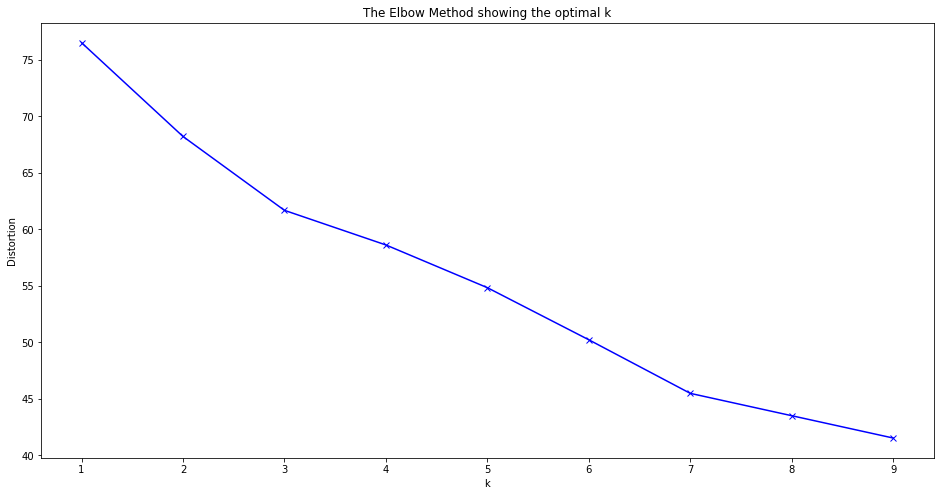

In [119]:
plt.figure(figsize=(16,8))
plt.plot(K, distortions_Haiti, 'bx-')
plt.xlabel('k')
plt.ylabel('Distortion')
plt.title('The Elbow Method showing the optimal k')
plt.show()

#### Creating clusters

In [120]:
kclusters = 4

Haiti_grouped_clustering = Haiti_onehot

kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Haiti_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10]

array([3, 0, 0, 0, 0, 0, 0, 2, 0, 0])

#### Adding cluster in Venue dataframe

In [121]:
nearby_venues_Haiti.insert(0, 'Cluster Labels', kmeans.labels_)
nearby_venues_Haiti.head()

,Cluster Labels,name,categories,lat,lng
0,3,Wahoo Bay Beach,Resort,18.876689,-72.615515
1,0,Marie Beliard,Bakery,18.516036,-72.288455
2,0,Rebo Expresso,Coffee Shop,18.512118,-72.283136
3,0,ASU ROOFTOP Lounge,Lounge,18.521174,-72.300220
4,0,5 Coins (Centre Ville),Restaurant,18.533747,-72.340001


#### Create DataFrame for cluster 0

In [122]:
cluster_Haiti0=nearby_venues_Haiti[nearby_venues_Haiti['Cluster Labels']==0]
cluster_Haiti0.head()

,Cluster Labels,name,categories,lat,lng
1,0,Marie Beliard,Bakery,18.516036,-72.288455
2,0,Rebo Expresso,Coffee Shop,18.512118,-72.283136
3,0,ASU ROOFTOP Lounge,Lounge,18.521174,-72.300220
4,0,5 Coins (Centre Ville),Restaurant,18.533747,-72.340001
5,0,Patisserie Ste Claire,Bakery,18.535652,-72.320370


#### Review categories in cluster 0

In [123]:
cluster_Haiti0_plot=cluster_Haiti0.groupby('categories').count()
cluster_Haiti0_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Airport,1,1,1,1
American Restaurant,1,1,1,1
Arepa Restaurant,1,1,1,1
Arts & Crafts Store,1,1,1,1
BBQ Joint,1,1,1,1


#### Created bar graph to better view the different categories and which one is the most common to name the cluster

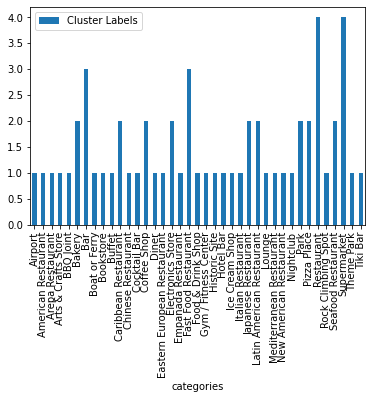

In [124]:
cluster_Haiti0_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [125]:
cluster_Haiti1=nearby_venues_Haiti[nearby_venues_Haiti['Cluster Labels']==1]
cluster_Haiti1.head()

,Cluster Labels,name,categories,lat,lng
21,1,Adrenaline Beach,Beach,19.786472,-72.242096
49,1,Barefoot Beach Club,Beach,19.783237,-72.250301
52,1,Columbus Cove,Beach,19.785367,-72.242419
53,1,Playa Punta Rusia,Beach,19.840671,-71.213112
54,1,La Ensenada,Beach,19.858542,-71.208529


In [126]:
cluster_Haiti1_plot=cluster_Haiti1.groupby('categories').count()
cluster_Haiti1_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Beach,6,6,6,6


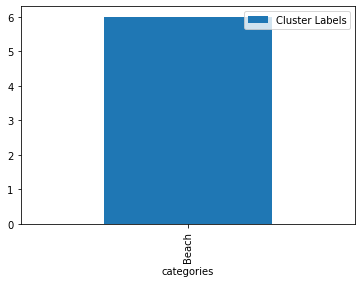

In [127]:
cluster_Haiti1_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [128]:
cluster_Haiti2=nearby_venues_Haiti[nearby_venues_Haiti['Cluster Labels']==2]
cluster_Haiti2.head()

,Cluster Labels,name,categories,lat,lng
7,2,Karibe Hotel,Hotel,18.521091,-72.300851
16,2,Visa Lodge,Hotel,18.568641,-72.302239
36,2,Executive Villas,Hotel,18.554892,-72.242986
40,2,Best Western Premier Petion-Ville,Hotel,18.512712,-72.284974
64,2,Auberge du Picolet,Hotel,19.768338,-72.194150


In [129]:
cluster_Haiti2_plot=cluster_Haiti2.groupby('categories').count()
cluster_Haiti2_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Hotel,9,9,9,9


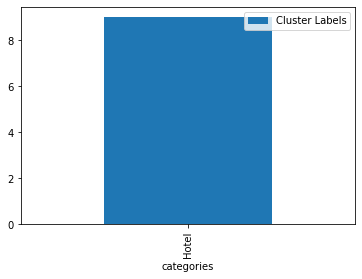

In [130]:
cluster_Haiti2_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

In [131]:
cluster_Haiti3=nearby_venues_Haiti[nearby_venues_Haiti['Cluster Labels']==3]
cluster_Haiti3.head()

,Cluster Labels,name,categories,lat,lng
0,3,Wahoo Bay Beach,Resort,18.876689,-72.615515
25,3,NH Hotel El Rancho,Resort,18.521142,-72.291396
48,3,Labadee,Resort,19.786188,-72.244062
60,3,Moulin Sur Mer,Resort,18.951664,-72.719082
62,3,Kaliko Beach Resorts,Resort,18.871174,-72.615530


In [132]:
cluster_Haiti3_plot=cluster_Haiti3.groupby('categories').count()
cluster_Haiti3_plot.head()

,Cluster Labels,name,lat,lng
categories,,,,
Resort,7,7,7,7


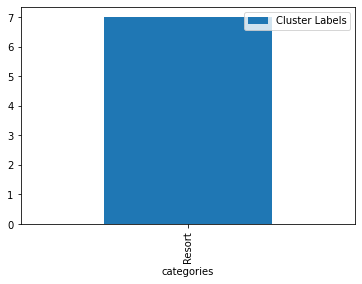

In [133]:
cluster_Haiti3_plot[['Cluster Labels']].plot(kind='bar')
plt.show()

#### Naming the clusters and updating the dataframe with names

In [135]:
nearby_venues_Haiti2=nearby_venues_Haiti.copy()
nearby_venues_Haiti2['Cluster Labels']=nearby_venues_Haiti2['Cluster Labels'].replace(0,'Restaurants, Supermarkets and other social venues')
nearby_venues_Haiti2['Cluster Labels']=nearby_venues_Haiti2['Cluster Labels'].replace(1,'Beach')
nearby_venues_Haiti2['Cluster Labels']=nearby_venues_Haiti2['Cluster Labels'].replace(2,'Hotels')
nearby_venues_Haiti2['Cluster Labels']=nearby_venues_Haiti2['Cluster Labels'].replace(3,'Resorts')
nearby_venues_Haiti2.head()

,Cluster Labels,name,categories,lat,lng
0,Resorts,Wahoo Bay Beach,Resort,18.876689,-72.615515
1,"Restaurants, Supermarkets and other social venues",Marie Beliard,Bakery,18.516036,-72.288455
2,"Restaurants, Supermarkets and other social venues",Rebo Expresso,Coffee Shop,18.512118,-72.283136
3,"Restaurants, Supermarkets and other social venues",ASU ROOFTOP Lounge,Lounge,18.521174,-72.300220
4,"Restaurants, Supermarkets and other social venues",5 Coins (Centre Ville),Restaurant,18.533747,-72.340001


#### Creating map with locations, venues in clusters and population

In [136]:
# create map
Haiti_map_clusters = folium.Map(location=[latitude, longitude], zoom_start=8)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
colordict2 = {0: 'grey', 1: 'green'}
##
    
for lat, lng, label, label2, activity in zip(df_HaitiLoc_copy['Latitude'], df_HaitiLoc_copy['Longitude'], df_HaitiLoc_copy['Name'], df_HaitiLoc_copy['Country Code'], df_HaitiLoc_copy['Activity']):
    label = folium.Popup(str(label2) + ' / ' + str(label), parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color=colordict2[activity],
        key_on=activity,
        threshold_scale=[0,1],
        fill=True,
        fill_color=colordict2[activity],
        fill_opacity=0.8,
        parse_html=False).add_to(Haiti_map_clusters)  

Haiti_map_clusters.choropleth(
    geo_data=haiti_geo,
    data=df_Haiti_data,
    columns=['City','Population'],
    key_on='feature.properties.area_name',
    fill_color='YlOrRd',
    #fill_color='Blues',
    fill_opacity=0.2,
    line_opacity=0.3,
    legend_name='Haiti Population by City'
    )

markers_colors = []
for lat, lon, poi, cluster, name, cluster2 in zip(nearby_venues_Haiti['lat'], nearby_venues_Haiti['lng'], nearby_venues_Haiti['categories'], nearby_venues_Haiti['Cluster Labels'], nearby_venues_Haiti['name'], nearby_venues_Haiti2['Cluster Labels']):
    label = folium.Popup(str(name) + '-' + str(poi) + '-' + ' Cluster: ' + str(cluster2), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=1.0).add_to(Haiti_map_clusters)       

Haiti_map_clusters